In [16]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

import matplotlib.ticker as mtick

# Load Raw Data    
df = pd.read_csv("retrospective_raw_data.csv")

countries_keep = ["Brunei", "Cambodia", "Indonesia", "Laos", "Malaysia", "Myanmar", "Philippines", "Singapore", "Thailand", "Timor-Leste", "Vietnam"]
df = df[df["Countries"].isin(countries_keep)]
df.head()

,Commodities,Countries,DomesticForeign,District,Time,Value ($US) (Default Member)
0,2504 Natural Graphite,Indonesia,Foreign Exports,All Districts,2012,5852
1,2504 Natural Graphite,Indonesia,Foreign Exports,All Districts,August 2012,5852
2,2504 Natural Graphite,Malaysia,Foreign Exports,All Districts,2025,49650
3,2504 Natural Graphite,Malaysia,Foreign Exports,All Districts,November 2025,49650
4,2504 Natural Graphite,Singapore,Foreign Exports,All Districts,2012,2800


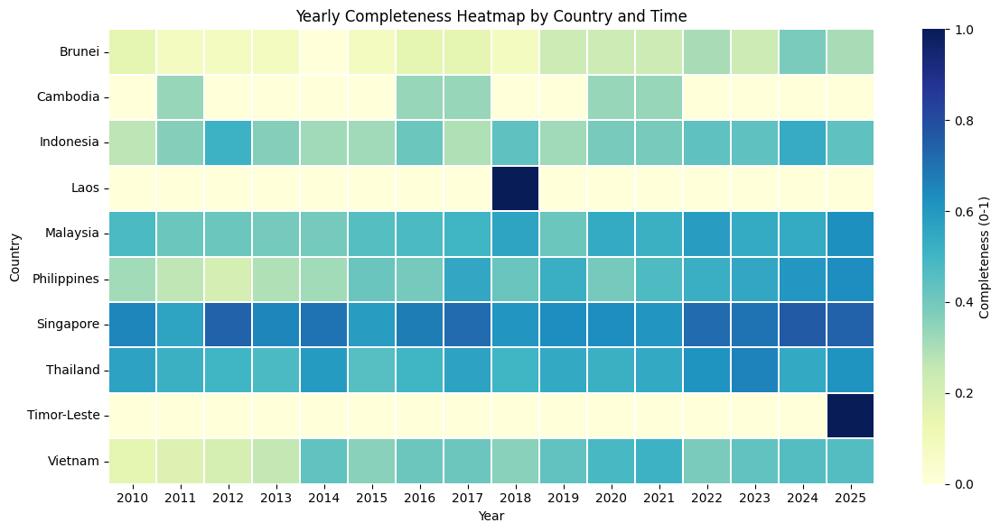

In [17]:
# Data Completeness Check
country_col = "Countries" if "Countries" in df.columns else None
commodity_col = "Commodities" if "Commodities" in df.columns else None
if country_col is None or commodity_col is None:
    raise ValueError("Missing Countries or Commodities column. Please check the raw data schema.")

# filter yearly data
yearly = df[df["Time"].astype(str).str.fullmatch(r"\d{4}", na=False)].copy()
yearly["year"] = pd.to_numeric(yearly["Time"], errors="coerce").astype("Int64")
yearly_plot = yearly.dropna(subset=["year"]).copy()
yearly_plot["year"] = yearly_plot["year"].astype(int)

# observed commodities per country-year
observed = yearly_plot.groupby([country_col, "year"])[commodity_col].nunique()

# total number of commodities per country over all years
total = yearly_plot.groupby(country_col)[commodity_col].nunique()

completeness = observed.div(total, level=0).rename("completeness")

# matrix for heatmap
yearly_pivot = (
    completeness.reset_index()
    .pivot(index=country_col, columns="year", values="completeness")
    .fillna(0)
    .sort_index()
    .sort_index(axis=1)
)

n_rows, n_cols = yearly_pivot.shape
fig_w = max(12, min(36, n_cols * 0.28))
fig_h = max(6, min(30, n_rows * 0.35))

plt.figure(figsize=(fig_w, fig_h))
sns.heatmap(
    yearly_pivot,
    cmap="YlGnBu",
    vmin=0,
    vmax=1,
    linewidths=0.2,
    linecolor="white",
    cbar_kws={"label": "Completeness (0-1)"}
 )
plt.title("Yearly Completeness Heatmap by Country and Time")
plt.xlabel("Year")
plt.ylabel("Country")
plt.tight_layout()
plt.show()

In [18]:
# Data Preprocessing  
# Check if Time column exists, reload if needed
if 'Time' not in df.columns:
    print("[Warning] Re-loading data because 'Time' column is missing")
    df = pd.read_csv("retrospective_raw_data.csv")
    countries_keep = ["Brunei", "Cambodia", "Indonesia", "Laos", "Malaysia", "Myanmar", "Philippines", "Singapore", "Thailand", "Timor-Leste", "Vietnam"]
    df = df[df["Countries"].isin(countries_keep)]

df = df.drop(columns=['DomesticForeign', 'District'], errors='ignore')
df['HS_Code'] = df['Commodities'].astype(str).str[:4]




# Remove rows with only year because all monthly values add up to the yearly value anyway
df = df[df['Time'].astype(str).str.strip().str.len() != 4]

# Create Month column
temp = df['Time'].str.split()
month_map = {
    "January": 1,
    "February": 2,
    "March": 3,
    "April": 4,
    "May": 5,
    "June": 6,
    "July": 7,
    "August": 8,
    "September": 9,
    "October": 10,
    "November": 11,
    "December": 12
}

df['Month'] = temp.str[0].map(month_map)

# Create Year column
df['Year'] = temp.str[-1].astype(int)
df = df.drop(columns = ['Time'])

df = df.rename(columns={'Value ($US) (Default Member)': 'Nominal_Value'})

# Adjusting for Inflation
inflation_rates = pd.read_csv("inflation_rates.csv")
df = df.merge(inflation_rates, on="Year")

# Use annual inflation rates for all months (i.e. for all months in 2011, use the annual inflation rate for 2011 to calculate CPI)

df['CPI'] = np.nan
curr_cpi = 100
print(f"[Data Flow] Before CPI calculation: {len(df)} rows")

for year in range(2010, 2026):
    inf_rate_rows = df[df['Year'] == year]
    if len(inf_rate_rows) == 0:
        print(f"  - Year {year}: No data found, skipping")
        continue
    
    try:
        inf_rate = inf_rate_rows['Inflation_Rate'].iloc[0] / 100
    except (IndexError, KeyError) as e:
        print(f"  - Year {year}: Error reading inflation rate - {e}")
        continue

    if (year == 2010):
        df.loc[df['Year'] == 2010, 'CPI'] = curr_cpi
    else:
        curr_cpi = curr_cpi * (inf_rate + 1)
        df.loc[df['Year'] == year, 'CPI'] = curr_cpi

# Quick check that all rows have a CPI value
print(f"After CPI calculation: {df['CPI'].isna().sum()} missing CPI values")

# Convert nominal to real values
df['Real_Value'] = ((df['Nominal_Value'] / df['CPI']) * 100).round(3)

# Create Category Type column
def classify_commodity(commodity):
    if "Ore" in commodity or "Concentrates" in commodity:
        return "Ore/Raw"
    elif "Oxide" in commodity or "Compound" in commodity:
        return "Compound"
    elif "Article" in commodity or "And Articles" in commodity:
        return "Refined/Articles"
    elif "Battery" in commodity or "Magnet" in commodity:
        return "Advanced Product"
    else:
        return "Other"

df["CategoryType"] = df["Commodities"].apply(classify_commodity)

print(f"\n[Data Flow] After preprocessing: {len(df)} rows")
print(df.head())

[Data Flow] Before CPI calculation: 8234 rows
After CPI calculation: 0 missing CPI values

[Data Flow] After preprocessing: 8234 rows
             Commodities  Countries  Nominal_Value HS_Code  Month  Year  \
0  2504 Natural Graphite  Indonesia           5852    2504      8  2012   
1  2504 Natural Graphite   Malaysia          49650    2504     11  2025   
2  2504 Natural Graphite  Singapore           2800    2504      7  2012   
3  2504 Natural Graphite   Thailand         110900    2504     10  2020   
4  2504 Natural Graphite   Thailand          10269    2504     12  2020   

   Inflation_Rate         CPI  Real_Value CategoryType  
0             1.7  104.751000    5586.582        Other  
1             2.7  148.078914   33529.419        Other  
2             1.7  104.751000    2673.006        Other  
3             1.4  118.919611   93256.276        Other  
4             1.4  118.919611    8635.245        Other  


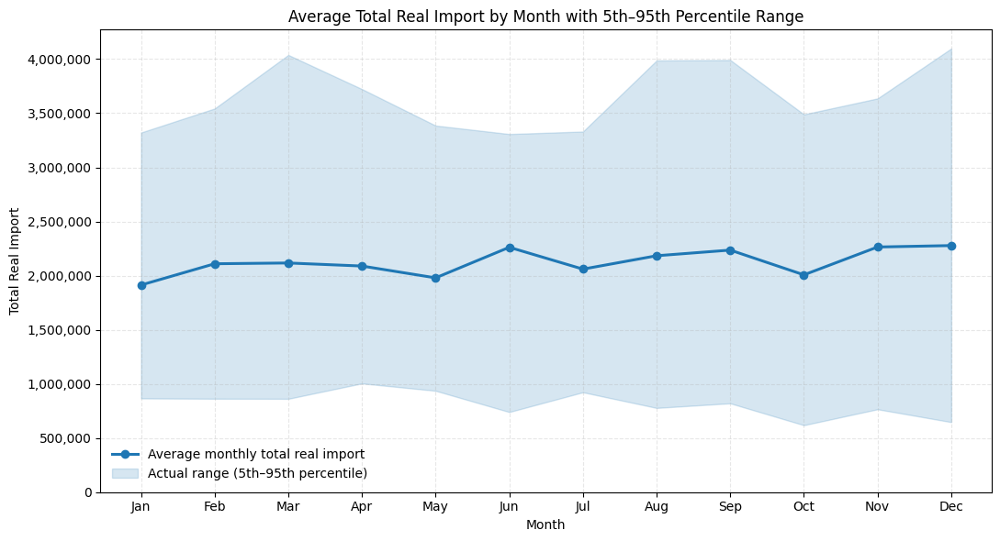

    Month          mean           p05           p95  count
0       1  1.913104e+06  8.657701e+05  3.321568e+06     16
1       2  2.109598e+06  8.630560e+05  3.543577e+06     16
2       3  2.116756e+06  8.621064e+05  4.038401e+06     16
3       4  2.088581e+06  1.004378e+06  3.723298e+06     16
4       5  1.979397e+06  9.361399e+05  3.386052e+06     16
5       6  2.261676e+06  7.398908e+05  3.307972e+06     16
6       7  2.060129e+06  9.223881e+05  3.330866e+06     16
7       8  2.183585e+06  7.778556e+05  3.987164e+06     16
8       9  2.235859e+06  8.202887e+05  3.991666e+06     16
9      10  2.007105e+06  6.182637e+05  3.489523e+06     16
10     11  2.264348e+06  7.655610e+05  3.636835e+06     16
11     12  2.277647e+06  6.468641e+05  4.098040e+06     16


In [19]:
top_filter = df['Real_Value'].quantile(0.99)
df_filtered = df[df['Real_Value'] <= top_filter]

monthly_total = (
    df_filtered.groupby(['Year', 'Month'], as_index=False)['Real_Value']
      .sum()
      .rename(columns={'Real_Value': 'Monthly_Total_Real_Import'})
)

summary = (
    monthly_total.groupby('Month')['Monthly_Total_Real_Import']
    .agg(
        mean='mean',
        p05=lambda x: x.quantile(0.05),
        p95=lambda x: x.quantile(0.95),
        count='count'
    )
    .reset_index()
    .sort_values('Month')
)

month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# 3. 画图
_, ax = plt.subplots(figsize=(11, 6))

ax.plot(
    summary['Month'],
    summary['mean'],
    color='#1f77b4',
    marker='o',
    linewidth=2.2,
    label='Average monthly total real import'
)

ax.fill_between(
    summary['Month'],
    summary['p05'],
    summary['p95'],
    color='#1f77b4',
    alpha=0.18,
    label='Actual range (5th–95th percentile)'
)

ax.set_xticks(range(1, 13))
ax.set_xticklabels(month_labels)
ax.set_ylim(bottom=0)
ax.set_xlabel('Month')
ax.set_ylabel('Total Real Import')
ax.set_title('Average Total Real Import by Month with 5th–95th Percentile Range')
ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('{x:,.0f}'))

ax.grid(True, alpha=0.3, linestyle='--')
ax.legend(frameon=False)

plt.tight_layout()
plt.show()

print(summary[['Month', 'mean', 'p05', 'p95', 'count']])


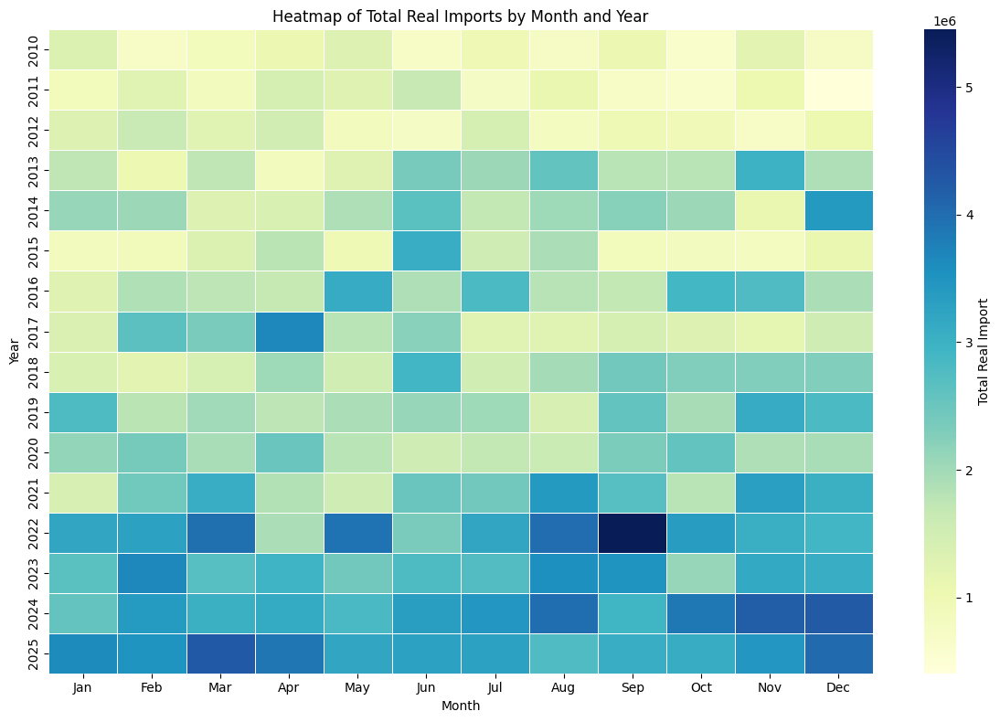

In [ ]:
monthly_total = (
    df_filtered.groupby(['Year', 'Month'], as_index=False)['Real_Value']
      .sum()
      .rename(columns={'Real_Value': 'Monthly_Total_Real_Import'})
)

heatmap_data = monthly_total.pivot(
    index='Year',
    columns='Month',
    values='Monthly_Total_Real_Import'
)

heatmap_data = heatmap_data.reindex(columns=range(1, 13))

month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(12, 8))
ax = sns.heatmap(
    heatmap_data,
    cmap='YlGnBu',
    linewidths=0.5,
    linecolor='white',
    cbar_kws={'label': 'Total Real Import'}
)

ax.set_title('Heatmap of Total Real Imports by Month and Year')
ax.set_xlabel('Month')
ax.set_ylabel('Year')
ax.set_xticklabels(month_labels, rotation=0)

plt.tight_layout()
plt.show()

In [21]:
df["Element"] = None

ELEMENT_KEYWORDS = {
    "base_metals": ["Copper", "Aluminum", "Aluminium", "Nickel", "Zinc", "Titanium"],
    "battery_materials": ["Lithium", "Cobalt", "Graphite", "Manganese"],
    "rare_earth_elements": [
        "Scandium", "Yttrium", "Lanthanum", "Cerium", "Praseodymium", "Neodymium",
        "Promethium", "Samarium", "Europium", "Gadolinium", "Terbium", "Dysprosium",
        "Holmium", "Erbium", "Thulium", "Ytterbium", "Lutetium",
        "Rare Earth", "Rare Earths", "Rare-Earth", "Rare-Earths", "Lanthanide", "Lanthanides",
    ],
}

def classify_elements_by_keywords(dataframe, keyword_map):
    """Match the first keyword found in Commodities for each row."""
    match_counts = {category: 0 for category in keyword_map}

    for category, keywords in keyword_map.items():
        for keyword in keywords:
            # Check one keyword at a time so the first match wins.
            contains_keyword = dataframe["Commodities"].str.contains(
                re.escape(keyword), case=False, na=False
            )
            unclassified_mask = dataframe["Element"].isna()
            final_mask = contains_keyword & unclassified_mask

            matched_rows = final_mask.sum()
            if matched_rows > 0:
                # Keep the raw keyword that matched for easier inspection later.
                dataframe.loc[final_mask, "Element"] = keyword
                match_counts[category] += matched_rows

    return match_counts

print(f"Before classification: {len(df)} rows, {df['Element'].isna().sum()} still unclassified")

match_stats = classify_elements_by_keywords(df, ELEMENT_KEYWORDS)

print(f"After classification: {df['Element'].isna().sum()} rows still without Element")
for category, count in match_stats.items():
    print(f"{category}: {count}")

unclassified_samples = df.loc[df["Element"].isna(), "Commodities"].dropna().unique()[:5]
if len(unclassified_samples) > 0:
    print("Unclassified samples:")
    for commodity in unclassified_samples:
        print(f"- {commodity}")

print(df.head())

Before classification: 8234 rows, 8234 still unclassified
After classification: 0 rows still without Element
base_metals: 7816
battery_materials: 305
rare_earth_elements: 113
             Commodities  Countries  Nominal_Value HS_Code  Month  Year  \
0  2504 Natural Graphite  Indonesia           5852    2504      8  2012   
1  2504 Natural Graphite   Malaysia          49650    2504     11  2025   
2  2504 Natural Graphite  Singapore           2800    2504      7  2012   
3  2504 Natural Graphite   Thailand         110900    2504     10  2020   
4  2504 Natural Graphite   Thailand          10269    2504     12  2020   

   Inflation_Rate         CPI  Real_Value CategoryType   Element  
0             1.7  104.751000    5586.582        Other  Graphite  
1             2.7  148.078914   33529.419        Other  Graphite  
2             1.7  104.751000    2673.006        Other  Graphite  
3             1.4  118.919611   93256.276        Other  Graphite  
4             1.4  118.919611    8635.2

In [22]:
print("Element classification check")

total_rows = len(df)
classified_rows = df["Element"].notna().sum()
unclassified_rows = df["Element"].isna().sum()

print(f"Rows: {total_rows}")
print(f"Classified: {classified_rows} ({100 * classified_rows / total_rows:.1f}%)")
print(f"Unclassified: {unclassified_rows} ({100 * unclassified_rows / total_rows:.1f}%)")

element_distribution = df.loc[df["Element"].notna(), "Element"].value_counts()
if not element_distribution.empty:
    print("Top element labels:")
    for element_name, count in element_distribution.items():
        print(f"{element_name}: {count}")

key_columns = ["Countries", "Commodities", "Real_Value", "CPI", "Element", "CategoryType"]
for column in key_columns:
    if column in df.columns:
        non_null = df[column].notna().sum()
        print(f"{column}: {non_null}/{total_rows}")

if "Year" in df.columns and df["Year"].notna().any():
    min_year = int(df["Year"].min())
    max_year = int(df["Year"].max())
    print(f"Year range: {min_year} - {max_year}")

classified_df = df[df["Element"].notna()].copy()
if classified_df.empty:
    print("No classified rows available.")
else:
    combo_counts = classified_df.groupby(["Countries", "Element"]).size()
    print(f"Country-element pairs: {len(combo_counts)}")
    print(f"Largest pair: {combo_counts.max()}")
    print(f"Smallest pair: {combo_counts.min()}")
    print(f"Average rows per pair: {combo_counts.mean():.1f}")

Element classification check
Rows: 8234
Classified: 8234 (100.0%)
Unclassified: 0 (0.0%)
Top element labels:
Aluminum: 3328
Copper: 2562
Nickel: 1101
Titanium: 588
Zinc: 237
Cobalt: 223
Scandium: 90
Graphite: 49
Manganese: 33
Rare-Earth: 16
Cerium: 7
Countries: 8234/8234
Commodities: 8234/8234
Real_Value: 8234/8234
CPI: 8234/8234
Element: 8234/8234
CategoryType: 8234/8234
Year range: 2010 - 2025
Country-element pairs: 67
Largest pair: 1015
Smallest pair: 1
Average rows per pair: 122.9


In [23]:
df_work = df.copy()

df_work["Date"] = pd.to_datetime(
    {"year": df_work["Year"], "month": df_work["Month"], "day": 1},
    errors="coerce",
)
df_work = df_work.dropna(subset=["Date"]).copy()

df_work["Countries"] = df_work["Countries"].astype(str).str.strip()
df_work["Element"] = df_work["Element"].astype(str).str.strip()
df_work = df_work.dropna(subset=["Countries", "Element"]).copy()

VALUE_SUM_COLUMNS = ["Nominal_Value", "Real_Value"]
MACRO_FILL_COLUMNS = ["Inflation_Rate", "CPI"]

aggregation_rules = {}
for col in VALUE_SUM_COLUMNS:
    if col in df_work.columns:
        aggregation_rules[col] = "sum"
for col in MACRO_FILL_COLUMNS:
    if col in df_work.columns:
        aggregation_rules[col] = "first"

if not aggregation_rules:
    raise ValueError(
        "No aggregatable columns found. Expected at least one of: "
        "Nominal_Value, Real_Value, Inflation_Rate, CPI"
    )

df_agg = (
    df_work.groupby(["Countries", "Element", "Date"], as_index=False)
    .agg(aggregation_rules)
    .sort_values(["Countries", "Element", "Date"])
)

def build_element_panel(data, mode="group"):
    """Build a monthly panel for each Country-Element pair."""
    filled_groups = []

    if mode == "global":
        global_dates = pd.date_range(data["Date"].min(), data["Date"].max(), freq="MS")

    for (country, element), group_df in data.groupby(["Countries", "Element"]):
        group_df = group_df.sort_values("Date").copy()

        if mode == "group":
            full_dates = pd.date_range(group_df["Date"].min(), group_df["Date"].max(), freq="MS")
        elif mode == "global":
            full_dates = global_dates
        else:
            raise ValueError("mode must be 'group' or 'global'")

        completed = (
            group_df.set_index("Date")
            .reindex(full_dates)
            .rename_axis("Date")
            .reset_index()
        )

        completed["Countries"] = country
        completed["Element"] = element

        for col in MACRO_FILL_COLUMNS:
            if col in completed.columns:
                completed[col] = completed[col].ffill().bfill()

        for col in VALUE_SUM_COLUMNS:
            if col in completed.columns:
                completed[col] = completed[col].fillna(0)

        filled_groups.append(completed)

    panel = pd.concat(filled_groups, ignore_index=True)
    panel["Year"] = panel["Date"].dt.year
    panel["Month"] = panel["Date"].dt.month
    panel = panel.sort_values(["Countries", "Element", "Date"]).reset_index(drop=True)

    front_columns = ["Date", "Year", "Month", "Countries", "Element"]
    other_columns = [col for col in panel.columns if col not in front_columns]
    return panel[front_columns + other_columns]

df_element = build_element_panel(df_agg, mode="group")


# filling check
sample = df_element[
    (df_element["Countries"] == "Cambodia") & (df_element["Element"] == "Copper")
].copy()
print("Cambodia + Copper")
if sample.empty:
    print("No rows found")
else:
    print(
        sample[["Date", "Year", "Month", "Countries", "Element", "Real_Value"]]
        .to_string(index=False)
    )
    print(f"rows: {len(sample)}")
    print(f"min date: {sample['Date'].min()}")
    print(f"max date: {sample['Date'].max()}")

cambodia_all = df_element[df_element["Countries"] == "Cambodia"].copy()
print("Cambodia all elements")
print(
    cambodia_all[["Date", "Year", "Month", "Countries", "Element", "Real_Value"]]
    .sort_values(["Date", "Element"])
    .head(30)
    .to_string(index=False)
)

Cambodia + Copper
      Date  Year  Month Countries Element  Real_Value
2016-07-01  2016      7  Cambodia  Copper   14061.239
2016-08-01  2016      8  Cambodia  Copper   14949.709
2016-09-01  2016      9  Cambodia  Copper       0.000
2016-10-01  2016     10  Cambodia  Copper       0.000
2016-11-01  2016     11  Cambodia  Copper       0.000
2016-12-01  2016     12  Cambodia  Copper       0.000
2017-01-01  2017      1  Cambodia  Copper       0.000
2017-02-01  2017      2  Cambodia  Copper       0.000
2017-03-01  2017      3  Cambodia  Copper       0.000
2017-04-01  2017      4  Cambodia  Copper       0.000
2017-05-01  2017      5  Cambodia  Copper       0.000
2017-06-01  2017      6  Cambodia  Copper       0.000
2017-07-01  2017      7  Cambodia  Copper       0.000
2017-08-01  2017      8  Cambodia  Copper       0.000
2017-09-01  2017      9  Cambodia  Copper       0.000
2017-10-01  2017     10  Cambodia  Copper       0.000
2017-11-01  2017     11  Cambodia  Copper       0.000
2017-12-01

In [24]:
print("Building MoM/YoY from existing panel")
print(f"df_agg rows: {len(df_agg)}")

df_element = df_element.sort_values(["Countries", "Element", "Date"]).reset_index(drop=True)

group_keys = ["Countries", "Element"]
df_element["MoM"] = df_element.groupby(group_keys)["Real_Value"].diff()
df_element["YoY"] = df_element.groupby(group_keys)["Real_Value"].diff(periods=12)

print(f"df_element rows: {len(df_element)}")
print(f"zero values: {(df_element['Real_Value'] == 0).sum()}")
print(f"MoM non-null: {df_element['MoM'].notna().sum()}")
print(f"YoY non-null: {df_element['YoY'].notna().sum()}")

zero_samples = df_element.loc[df_element["Real_Value"] == 0, ["Date", "Countries", "Element", "Real_Value", "MoM", "YoY"]]
print("Zero-value rows (first 25)")
print(zero_samples.head(25))

Building MoM/YoY from existing panel
df_agg rows: 3959
df_element rows: 9116
zero values: 5157
MoM non-null: 9049
YoY non-null: 8409
Zero-value rows (first 25)
         Date Countries   Element  Real_Value      MoM      YoY
1  2010-04-01    Brunei  Aluminum         0.0 -11568.0      NaN
2  2010-05-01    Brunei  Aluminum         0.0      0.0      NaN
3  2010-06-01    Brunei  Aluminum         0.0      0.0      NaN
5  2010-08-01    Brunei  Aluminum         0.0 -15007.0      NaN
6  2010-09-01    Brunei  Aluminum         0.0      0.0      NaN
7  2010-10-01    Brunei  Aluminum         0.0      0.0      NaN
8  2010-11-01    Brunei  Aluminum         0.0      0.0      NaN
9  2010-12-01    Brunei  Aluminum         0.0      0.0      NaN
10 2011-01-01    Brunei  Aluminum         0.0      0.0      NaN
11 2011-02-01    Brunei  Aluminum         0.0      0.0      NaN
12 2011-03-01    Brunei  Aluminum         0.0      0.0 -11568.0
13 2011-04-01    Brunei  Aluminum         0.0      0.0      0.0
14 2011-

In [25]:
X_QUANTILE_LOW = 0.05
X_QUANTILE_HIGH = 0.95
NEAR_ZERO_QUANTILE = 0.40
N_COLS = 2
ROLLING_WINDOW = 3

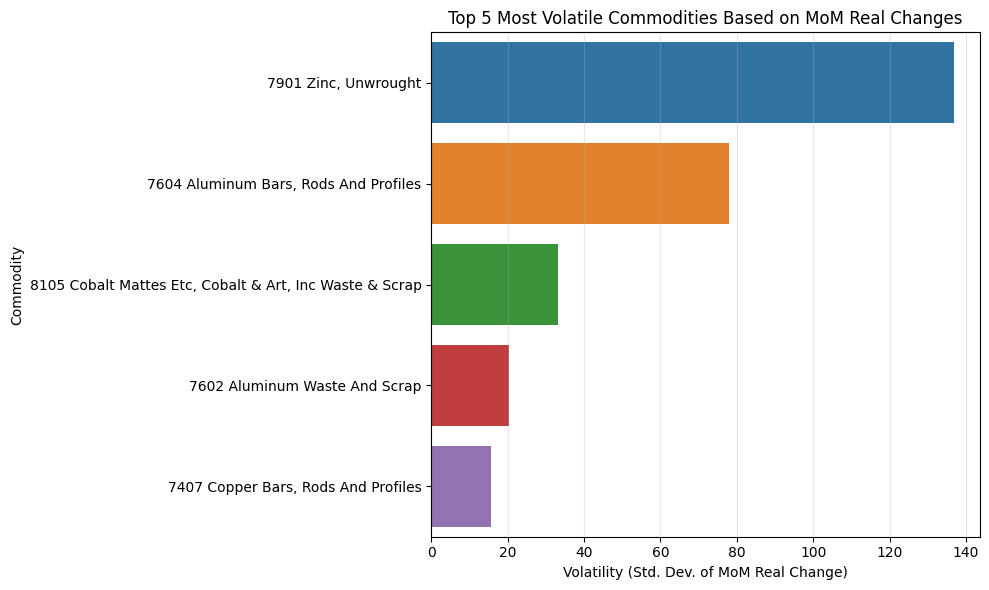

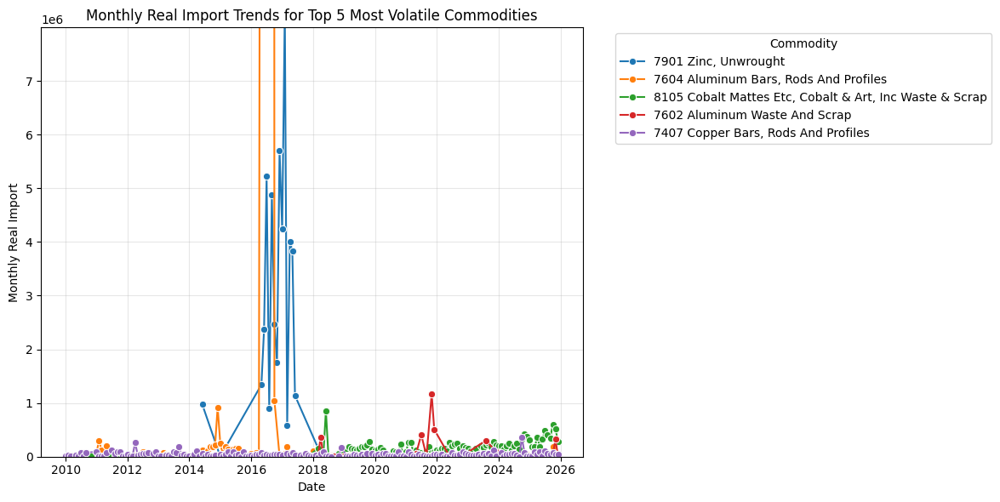

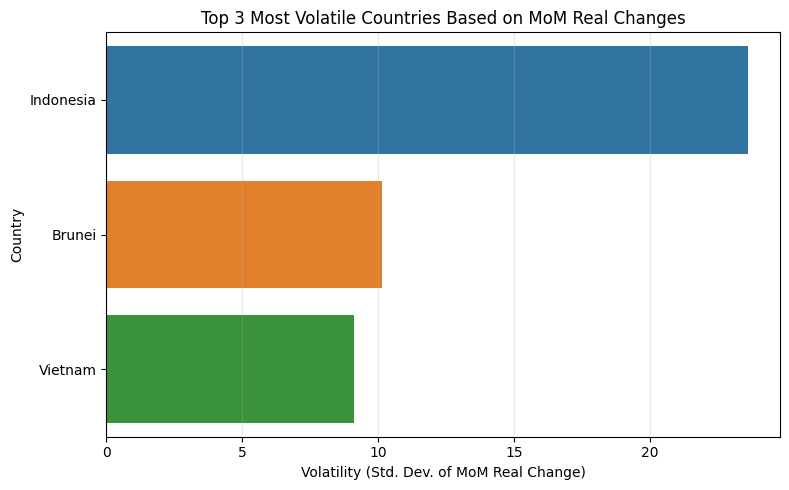

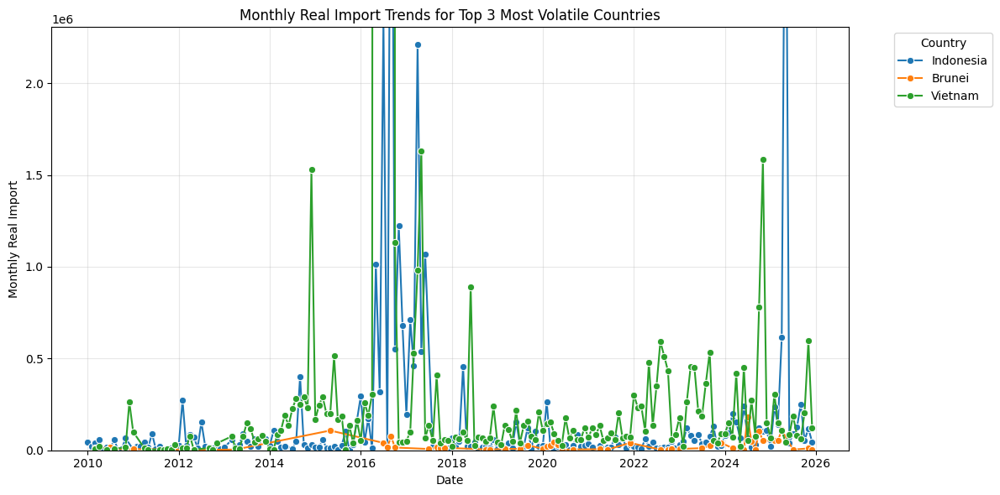

Top 5 commodities by MoM volatility:
                                          Commodities  MoM_Volatility
47                               7901 Zinc, Unwrought      136.822424
34              7604 Aluminum Bars, Rods And Profiles       77.946374
51  8105 Cobalt Mattes Etc, Cobalt & Art, Inc Wast...       33.242598
32                      7602 Aluminum Waste And Scrap       20.268099
17                7407 Copper Bars, Rods And Profiles       15.551018

Top 3 countries by MoM volatility:
   Countries  MoM_Volatility
2  Indonesia       23.602628
0     Brunei       10.134948
9    Vietnam        9.117658


In [26]:
default_palette = sns.color_palette()

# Top 5 most volatile commodities
commodity_monthly = (
    df_work.groupby(['Date', 'Commodities'], as_index=False)['Real_Value']
      .sum()
      .rename(columns={'Real_Value': 'Monthly_Real_Import'})
      .sort_values(['Commodities', 'Date'])
)

commodity_monthly['MoM_Change'] = (
    commodity_monthly.groupby('Commodities')['Monthly_Real_Import']
    .pct_change()
    .replace([np.inf, -np.inf], np.nan)
)

commodity_volatility = (
    commodity_monthly.groupby('Commodities')['MoM_Change']
    .std()
    .reset_index()
    .rename(columns={'MoM_Change': 'MoM_Volatility'})
    .dropna()
    .sort_values('MoM_Volatility', ascending=False)
)

top5_commodities = commodity_volatility.head(5).copy()
top5_commodity_names = top5_commodities['Commodities'].tolist()

# consistent color mapping using seaborn default palette
commodity_color_map = dict(
    zip(top5_commodity_names, default_palette[:len(top5_commodity_names)])
)

# Bar chart: top 5 volatile commodities
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top5_commodities,
    x='MoM_Volatility',
    y='Commodities',
    hue='Commodities',
    palette=commodity_color_map,
    order=top5_commodity_names,
    dodge=False,
    legend=False
)
plt.xlabel('Volatility (Std. Dev. of MoM Real Change)')
plt.ylabel('Commodity')
plt.title('Top 5 Most Volatile Commodities Based on MoM Real Changes')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Line chart: monthly real import for top 5 volatile commodities
commodity_monthly_top5 = commodity_monthly[
    commodity_monthly['Commodities'].isin(top5_commodity_names)
].copy()

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=commodity_monthly_top5,
    x='Date',
    y='Monthly_Real_Import',
    hue='Commodities',
    hue_order=top5_commodity_names,
    palette=commodity_color_map,
    marker='o'
)

y_upper_limit_commodity = commodity_monthly_top5['Monthly_Real_Import'].quantile(0.99) * 1.1
plt.ylim(0, y_upper_limit_commodity)

plt.xlabel('Date')
plt.ylabel('Monthly Real Import')
plt.title('Monthly Real Import Trends for Top 5 Most Volatile Commodities')
plt.legend(title='Commodity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Top 3 most volatile countries

country_monthly = (
    df_work.groupby(['Date', 'Countries'], as_index=False)['Real_Value']
      .sum()
      .rename(columns={'Real_Value': 'Monthly_Real_Import'})
      .sort_values(['Countries', 'Date'])
)

country_monthly['MoM_Change'] = (
    country_monthly.groupby('Countries')['Monthly_Real_Import']
    .pct_change()
    .replace([np.inf, -np.inf], np.nan)
)

country_volatility = (
    country_monthly.groupby('Countries')['MoM_Change']
    .std()
    .reset_index()
    .rename(columns={'MoM_Change': 'MoM_Volatility'})
    .dropna()
    .sort_values('MoM_Volatility', ascending=False)
)

top3_countries = country_volatility.head(3).copy()
top3_country_names = top3_countries['Countries'].tolist()

# consistent color mapping using seaborn default palette
country_color_map = dict(
    zip(top3_country_names, default_palette[:len(top3_country_names)])
)

# Bar chart: top 3 volatile countries
plt.figure(figsize=(8, 5))
sns.barplot(
    data=top3_countries,
    x='MoM_Volatility',
    y='Countries',
    hue='Countries',
    palette=country_color_map,
    order=top3_country_names,
    dodge=False,
    legend=False
)
plt.xlabel('Volatility (Std. Dev. of MoM Real Change)')
plt.ylabel('Country')
plt.title('Top 3 Most Volatile Countries Based on MoM Real Changes')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Line chart: monthly real import for top 3 volatile countries
country_monthly_top3 = country_monthly[
    country_monthly['Countries'].isin(top3_country_names)
].copy()

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=country_monthly_top3,
    x='Date',
    y='Monthly_Real_Import',
    hue='Countries',
    hue_order=top3_country_names,
    palette=country_color_map,
    marker='o'
)

y_upper_limit_country = country_monthly_top3['Monthly_Real_Import'].quantile(0.98) * 1.1
plt.ylim(0, y_upper_limit_country)

plt.xlabel('Date')
plt.ylabel('Monthly Real Import')
plt.title('Monthly Real Import Trends for Top 3 Most Volatile Countries')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("Top 5 commodities by MoM volatility:")
print(top5_commodities)

print("\nTop 3 countries by MoM volatility:")
print(top3_countries)

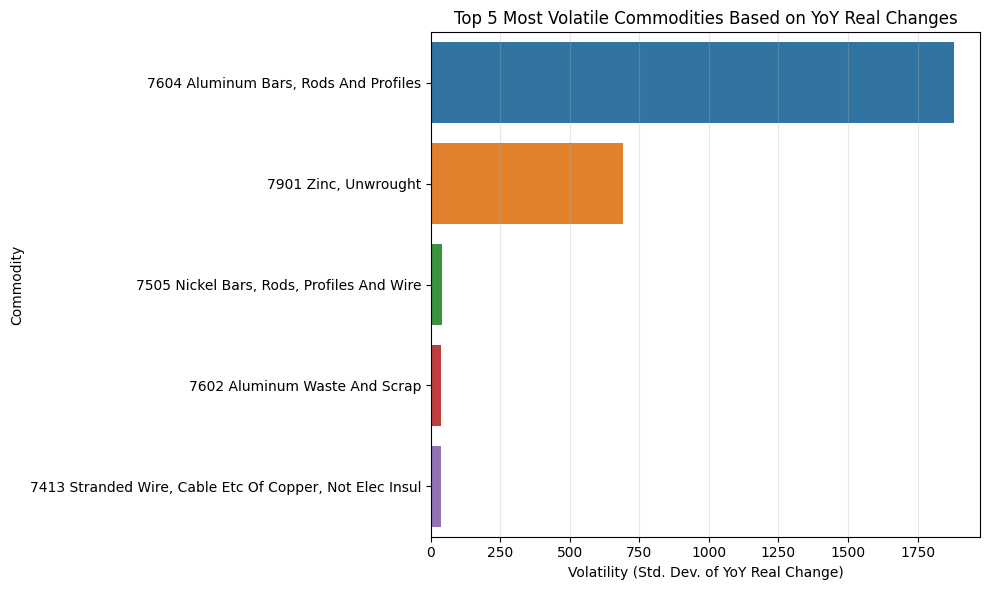

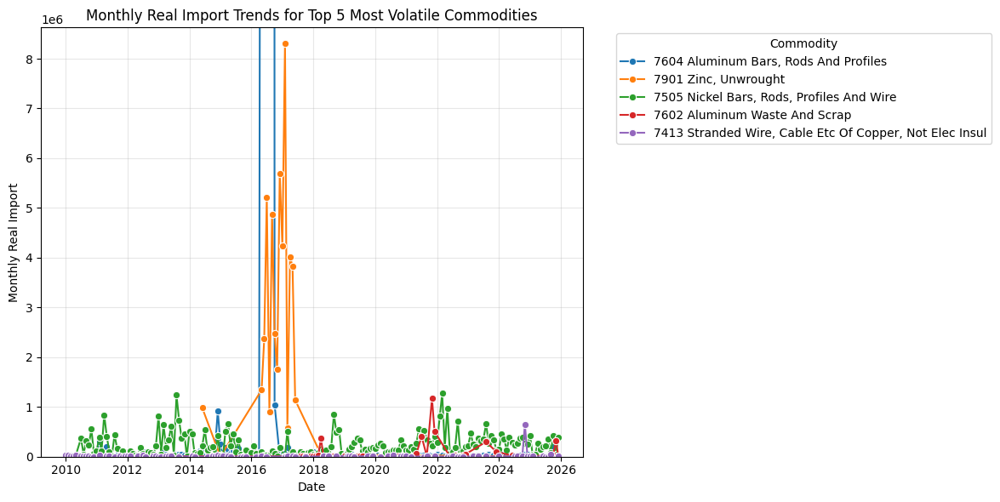

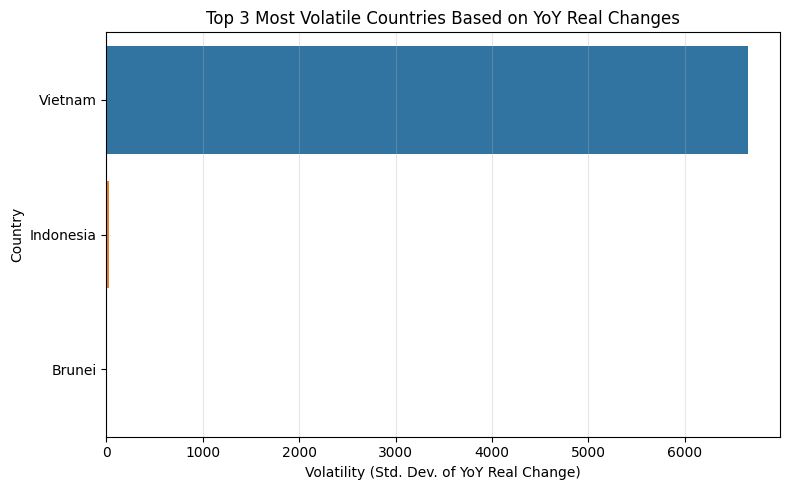

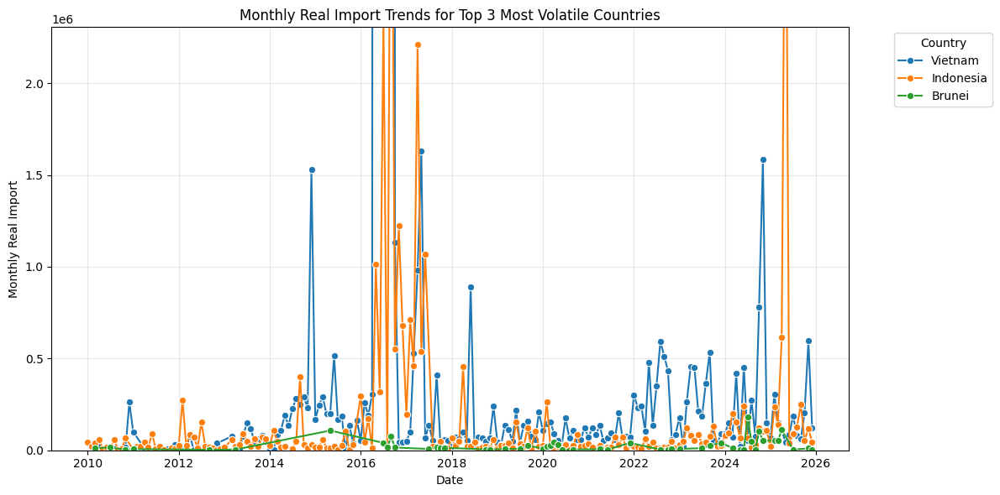

Top 5 commodities by YoY volatility:
                                          Commodities  YoY_Volatility
34              7604 Aluminum Bars, Rods And Profiles     1880.454661
47                               7901 Zinc, Unwrought      689.883019
29          7505 Nickel Bars, Rods, Profiles And Wire       38.692626
32                      7602 Aluminum Waste And Scrap       36.821260
23  7413 Stranded Wire, Cable Etc Of Copper, Not E...       35.406186

Top 3 countries by YoY volatility:
   Countries  YoY_Volatility
9    Vietnam     6652.979159
2  Indonesia       29.782643
0     Brunei        9.827501


In [27]:

# Top 5 most volatile commodities
commodity_monthly = (
    df_work.groupby(['Date', 'Commodities'], as_index=False)['Real_Value']
      .sum()
      .rename(columns={'Real_Value': 'Monthly_Real_Import'})
      .sort_values(['Commodities', 'Date'])
)

# YOY change: compare with same month last year
commodity_monthly['YoY_Change'] = (
    commodity_monthly.groupby('Commodities')['Monthly_Real_Import']
    .pct_change(12)
    .replace([np.inf, -np.inf], np.nan)
)

commodity_volatility = (
    commodity_monthly.groupby('Commodities')['YoY_Change']
    .std()
    .reset_index()
    .rename(columns={'YoY_Change': 'YoY_Volatility'})
    .dropna()
    .sort_values('YoY_Volatility', ascending=False)
)

top5_commodities = commodity_volatility.head(5).copy()
top5_commodity_names = top5_commodities['Commodities'].tolist()

# consistent color mapping using seaborn default palette
commodity_color_map = dict(
    zip(top5_commodity_names, default_palette[:len(top5_commodity_names)])
)

# Bar chart: top 5 volatile commodities
plt.figure(figsize=(10, 6))
sns.barplot(
    data=top5_commodities,
    x='YoY_Volatility',
    y='Commodities',
    hue='Commodities',
    palette=commodity_color_map,
    order=top5_commodity_names,
    dodge=False,
    legend=False
)
plt.xlabel('Volatility (Std. Dev. of YoY Real Change)')
plt.ylabel('Commodity')
plt.title('Top 5 Most Volatile Commodities Based on YoY Real Changes')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Line chart: monthly real import for top 5 volatile commodities
commodity_monthly_top5 = commodity_monthly[
    commodity_monthly['Commodities'].isin(top5_commodity_names)
].copy()

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=commodity_monthly_top5,
    x='Date',
    y='Monthly_Real_Import',
    hue='Commodities',
    hue_order=top5_commodity_names,
    palette=commodity_color_map,
    marker='o'
)

y_upper_limit_commodity = commodity_monthly_top5['Monthly_Real_Import'].quantile(0.99) * 1.1
plt.ylim(0, y_upper_limit_commodity)

plt.xlabel('Date')
plt.ylabel('Monthly Real Import')
plt.title('Monthly Real Import Trends for Top 5 Most Volatile Commodities')
plt.legend(title='Commodity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Top 3 most volatile countries
country_monthly = (
    df_work.groupby(['Date', 'Countries'], as_index=False)['Real_Value']
      .sum()
      .rename(columns={'Real_Value': 'Monthly_Real_Import'})
      .sort_values(['Countries', 'Date'])
)

# YOY change: compare with same month last year
country_monthly['YoY_Change'] = (
    country_monthly.groupby('Countries')['Monthly_Real_Import']
    .pct_change(12)
    .replace([np.inf, -np.inf], np.nan)
)

country_volatility = (
    country_monthly.groupby('Countries')['YoY_Change']
    .std()
    .reset_index()
    .rename(columns={'YoY_Change': 'YoY_Volatility'})
    .dropna()
    .sort_values('YoY_Volatility', ascending=False)
)

top3_countries = country_volatility.head(3).copy()
top3_country_names = top3_countries['Countries'].tolist()

# consistent color mapping using seaborn default palette
country_color_map = dict(
    zip(top3_country_names, default_palette[:len(top3_country_names)])
)

# Bar chart: top 3 volatile countries
plt.figure(figsize=(8, 5))
sns.barplot(
    data=top3_countries,
    x='YoY_Volatility',
    y='Countries',
    hue='Countries',
    palette=country_color_map,
    order=top3_country_names,
    dodge=False,
    legend=False
)
plt.xlabel('Volatility (Std. Dev. of YoY Real Change)')
plt.ylabel('Country')
plt.title('Top 3 Most Volatile Countries Based on YoY Real Changes')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Line chart: monthly real import for top 3 volatile countries
country_monthly_top3 = country_monthly[
    country_monthly['Countries'].isin(top3_country_names)
].copy()

plt.figure(figsize=(12, 6))
sns.lineplot(
    data=country_monthly_top3,
    x='Date',
    y='Monthly_Real_Import',
    hue='Countries',
    hue_order=top3_country_names,
    palette=country_color_map,
    marker='o'
)

y_upper_limit_country = country_monthly_top3['Monthly_Real_Import'].quantile(0.98) * 1.1
plt.ylim(0, y_upper_limit_country)

plt.xlabel('Date')
plt.ylabel('Monthly Real Import')
plt.title('Monthly Real Import Trends for Top 3 Most Volatile Countries')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

print("Top 5 commodities by YoY volatility:")
print(top5_commodities)

print("\nTop 3 countries by YoY volatility:")
print(top3_countries)

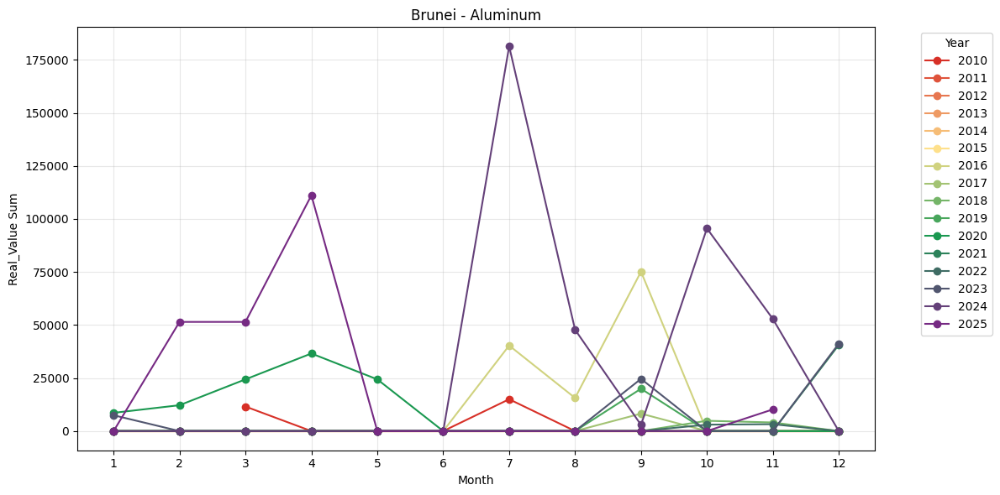

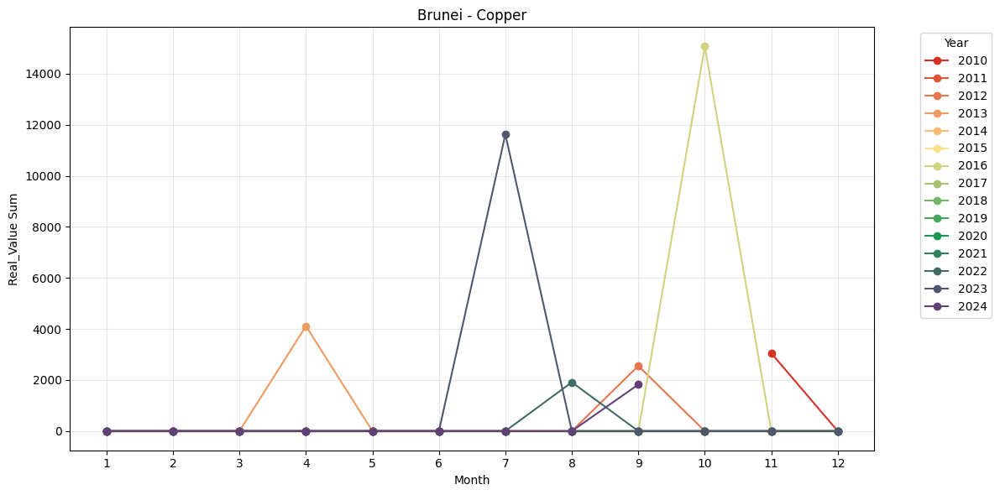

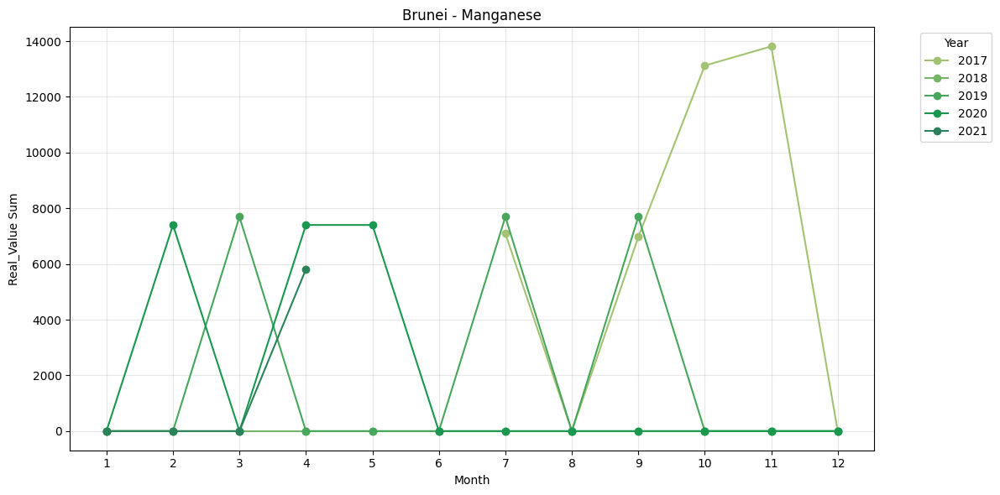

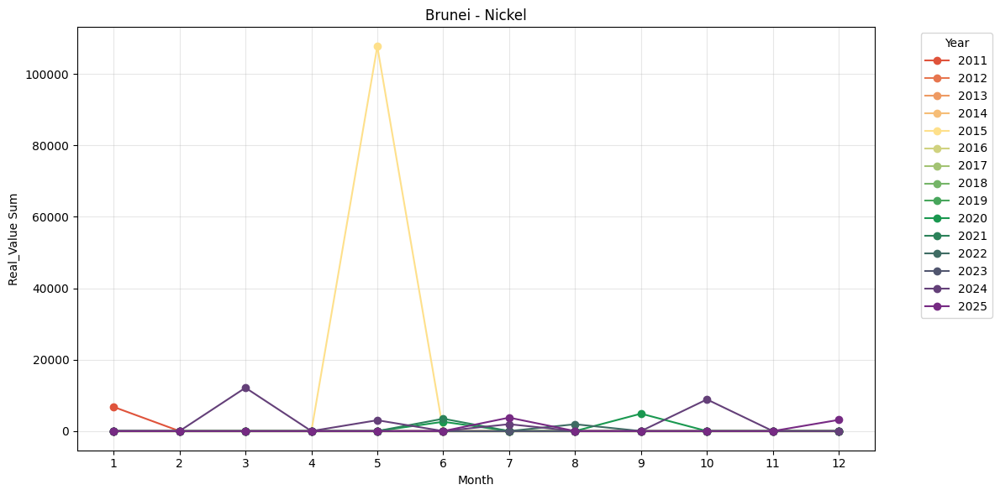

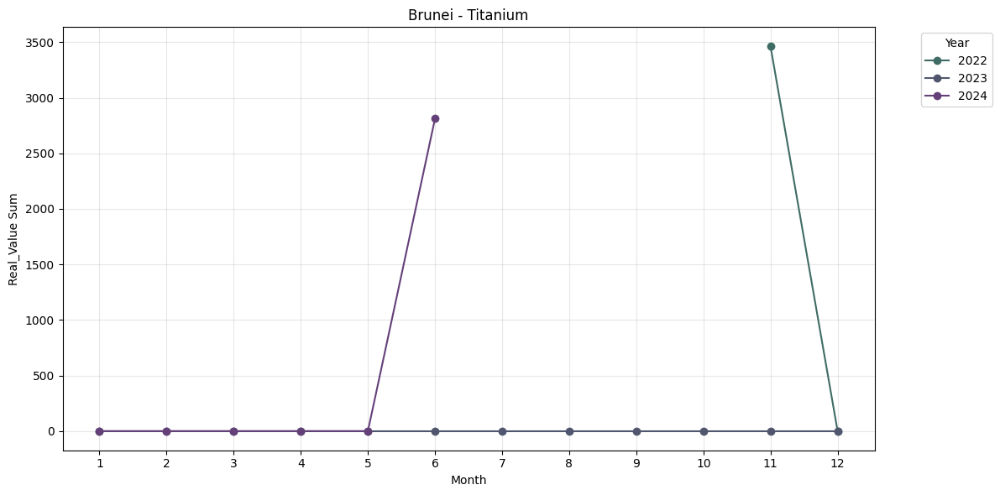

...

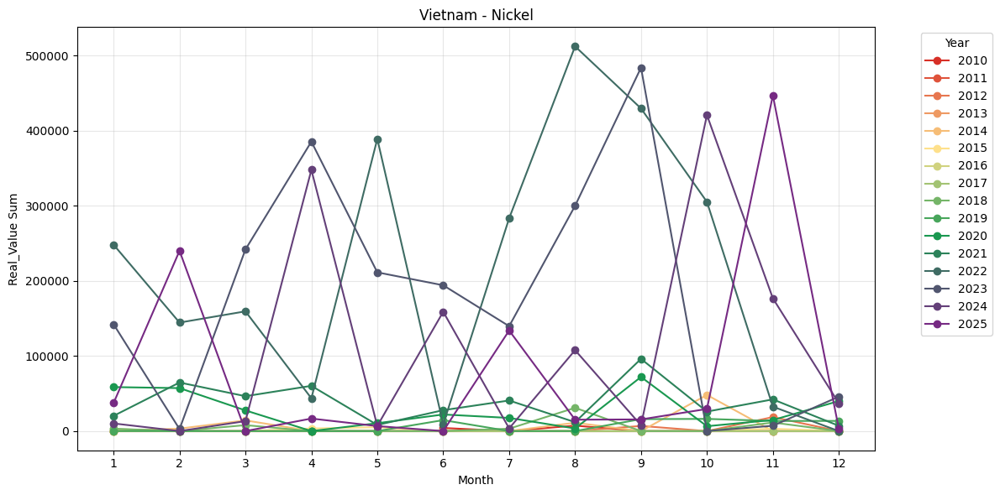

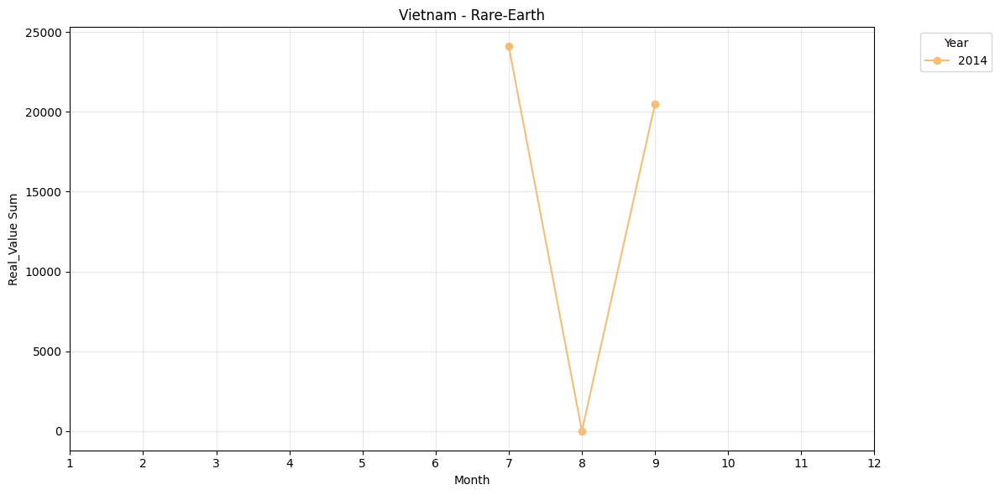

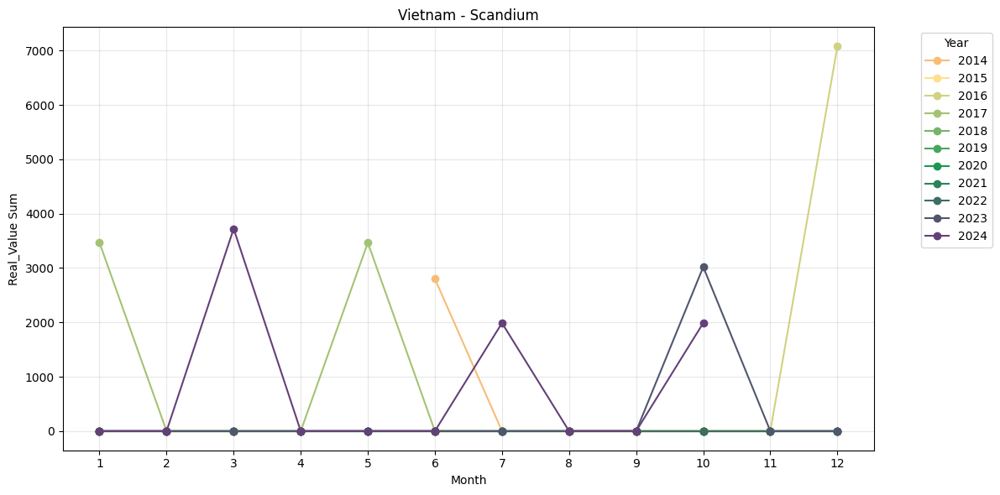

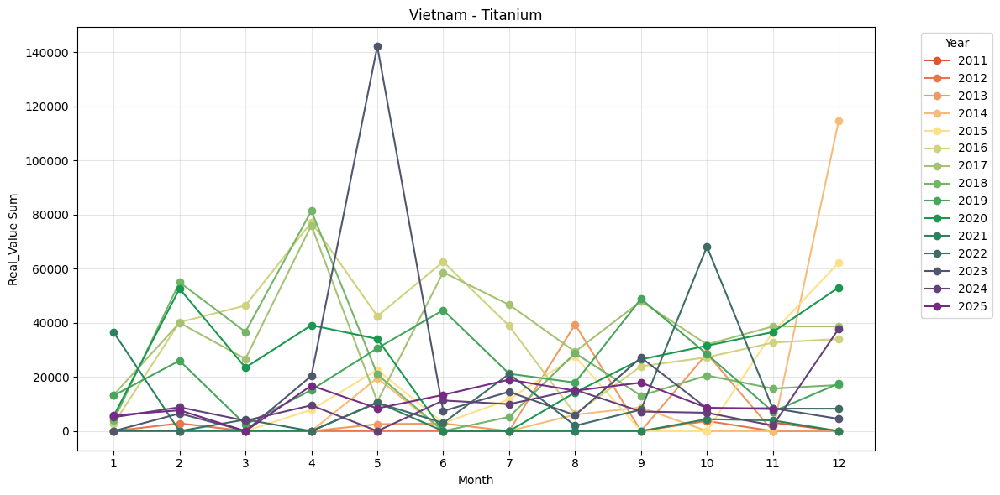

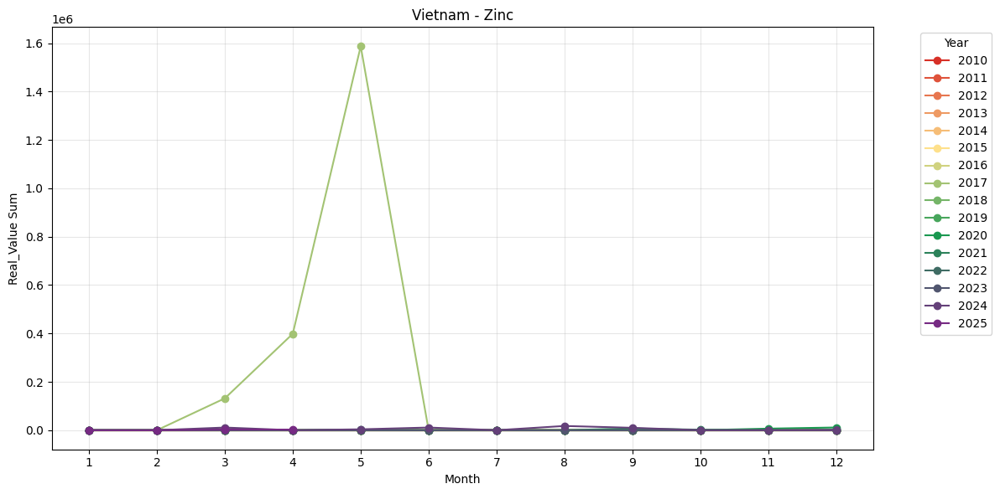

In [28]:
import matplotlib.colors as mcolors

years = sorted(df_element["Year"].dropna().unique())
year_cmap = mcolors.LinearSegmentedColormap.from_list(
    "red_yellow_green_purple",
    ["#d73027", "#fee08b", "#1a9850", "#762a83"],
)
year_colors = [year_cmap(i) for i in np.linspace(0, 1, len(years))]
year_color_map = dict(zip(years, year_colors))

for (country, element), group_df in df_element.groupby(["Countries", "Element"]):
    monthly_sum = (
        group_df.groupby(["Year", "Month"], as_index=False)["Real_Value"]
        .sum()
        .sort_values(["Year", "Month"])
)

    plt.figure(figsize=(12, 6))
    for year, year_df in monthly_sum.groupby("Year"):
        plt.plot(
            year_df["Month"],
            year_df["Real_Value"],
            marker="o",
            label=str(year),
            color=year_color_map.get(year),
        )

    plt.xticks(range(1, 13))
    plt.xlabel("Month")
    plt.ylabel("Real_Value Sum")
    plt.title(f"{country} - {element}")
    plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

Elements: ['Aluminum', 'Cerium', 'Cobalt', 'Copper', 'Graphite', 'Manganese', 'Nickel', 'Rare-Earth', 'Scandium', 'Titanium', 'Zinc']
Countries: ['Brunei', 'Cambodia', 'Indonesia', 'Laos', 'Malaysia', 'Philippines', 'Singapore', 'Thailand', 'Timor-Leste', 'Vietnam']
Elements count: 11
Countries count: 10
MoM observations: 9049
YoY observations: 8409
MoM range: -73036.7994, 76274.08280000005
YoY range: -65884.76879999999, 130798.63579999955
MoM near-zero cutoff: 0.0
YoY near-zero cutoff: 0.0


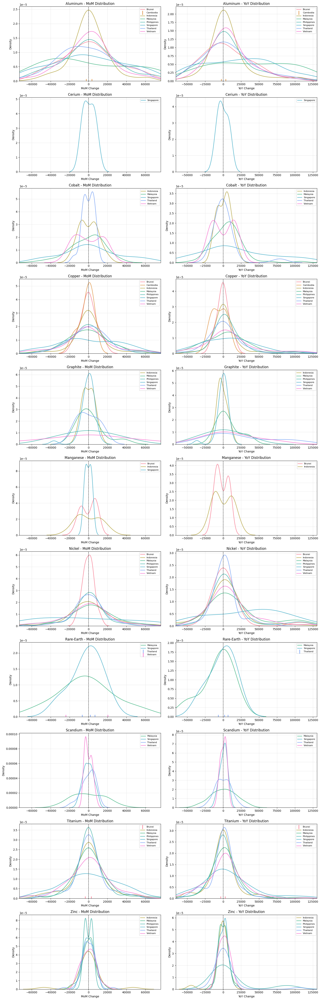

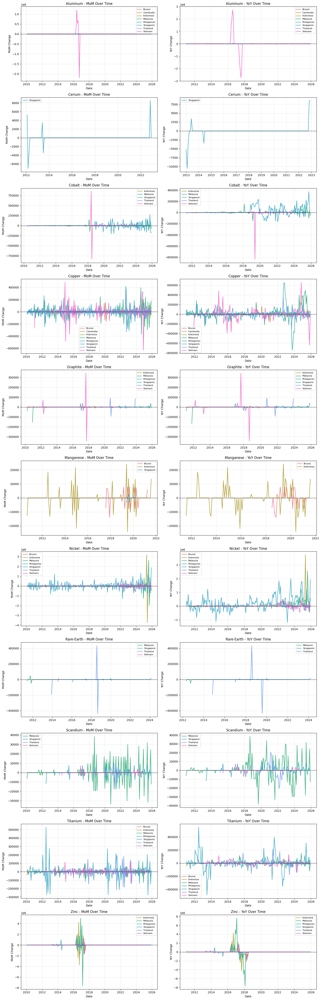

In [29]:
elements = sorted(df_element["Element"].dropna().unique())
countries = sorted(df_element["Countries"].dropna().unique())

palette = sns.color_palette("husl", n_colors=len(countries))
country_color_map = dict(zip(countries, palette))

nrows = (len(elements) + N_COLS - 1) // N_COLS

print("Elements:", elements)
print("Countries:", countries)
print("Elements count:", len(elements))
print("Countries count:", len(countries))

series_dict = {}
all_mom_series = []
all_yoy_series = []

for (country, element), group_df in df_element.groupby(["Countries", "Element"]):
    monthly_series = (
        group_df.groupby(["Year", "Month"], as_index=False)["Real_Value"]
        .sum()
        .sort_values(["Year", "Month"])
    )

    monthly_series["Date"] = pd.to_datetime(
        {"year": monthly_series["Year"], "month": monthly_series["Month"], "day": 1}
    )
    monthly_series = monthly_series.sort_values("Date")

    monthly_series["MoM_change"] = monthly_series["Real_Value"].diff()
    monthly_series["YoY_change"] = monthly_series["Real_Value"].diff(12)

    monthly_series["MoM_roll"] = monthly_series["MoM_change"].rolling(ROLLING_WINDOW).mean()
    monthly_series["YoY_roll"] = monthly_series["YoY_change"].rolling(ROLLING_WINDOW).mean()

    series_dict[(country, element)] = monthly_series

    mom_values = monthly_series["MoM_change"].dropna()
    yoy_values = monthly_series["YoY_change"].dropna()
    if not mom_values.empty:
        all_mom_series.append(mom_values)
    if not yoy_values.empty:
        all_yoy_series.append(yoy_values)

all_mom = pd.concat(all_mom_series, ignore_index=True)
all_yoy = pd.concat(all_yoy_series, ignore_index=True)

print(f"MoM observations: {len(all_mom)}")
print(f"YoY observations: {len(all_yoy)}")

mom_low, mom_high = all_mom.quantile([X_QUANTILE_LOW, X_QUANTILE_HIGH])
yoy_low, yoy_high = all_yoy.quantile([X_QUANTILE_LOW, X_QUANTILE_HIGH])

mom_zero_cut = all_mom.abs().quantile(NEAR_ZERO_QUANTILE)
yoy_zero_cut = all_yoy.abs().quantile(NEAR_ZERO_QUANTILE)

print(f"MoM range: {mom_low}, {mom_high}")
print(f"YoY range: {yoy_low}, {yoy_high}")
print(f"MoM near-zero cutoff: {mom_zero_cut}")
print(f"YoY near-zero cutoff: {yoy_zero_cut}")

def filter_changes_for_density(series, low, high, near_zero_cutoff):
    # Keep only valid observations, trim extreme tails, then remove values that are too close to zero.
    filtered = series.dropna()
    filtered = filtered[(filtered >= low) & (filtered <= high)]
    filtered = filtered[filtered.abs() > near_zero_cutoff]
    return filtered


def plot_density_or_ticks(ax, values, label, color):
    # Use a smooth density curve when there are enough points.
    if len(values) > 3:
        sns.kdeplot(
            data=values,
            ax=ax,
            label=label,
            color=color,
            linewidth=1.8,
            alpha=0.8,
            fill=False,
        )
        return True

    # For very small samples, show the observations as tick-like markers instead of KDE.
    if 1 <= len(values) <= 3:
        ax.scatter(
            values.values,
            np.zeros(len(values)),
            label=label,
            color=color,
            marker="|",
            s=220,
            linewidths=2,
            alpha=0.95,
        )
        return True

    # Nothing to draw when the filtered series is empty.
    return False


# One row per element, two panels per row: MoM on the left and YoY on the right.
nrows = len(elements)
fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(16, 4.5 * nrows))
if nrows == 1:
    axes = np.array([axes])

for row_index, element in enumerate(elements):
    ax_mom = axes[row_index, 0]
    ax_yoy = axes[row_index, 1]

    plotted_mom = False
    plotted_yoy = False

    for country in countries:
        key = (country, element)
        if key not in series_dict:
            continue

        monthly_series = series_dict[key]

        # Reuse the precomputed quantile thresholds to keep the plotted distributions comparable.
        mom_values = filter_changes_for_density(
            monthly_series["MoM_change"], mom_low, mom_high, mom_zero_cut
        )
        yoy_values = filter_changes_for_density(
            monthly_series["YoY_change"], yoy_low, yoy_high, yoy_zero_cut
        )

        plotted_mom = plot_density_or_ticks(
            ax_mom, mom_values, country, country_color_map[country]
        ) or plotted_mom
        plotted_yoy = plot_density_or_ticks(
            ax_yoy, yoy_values, country, country_color_map[country]
        ) or plotted_yoy

    # Left panel: month-over-month change distribution.
    ax_mom.axvline(0, color="black", linestyle="--", linewidth=1)
    ax_mom.set_xlim(mom_low, mom_high)
    ax_mom.set_title(f"{element} - MoM Distribution")
    ax_mom.set_xlabel("MoM Change")
    ax_mom.set_ylabel("Density")
    ax_mom.grid(True, alpha=0.3)
    if plotted_mom:
        ax_mom.legend(fontsize=8)

    # Right panel: year-over-year change distribution.
    ax_yoy.axvline(0, color="black", linestyle="--", linewidth=1)
    ax_yoy.set_xlim(yoy_low, yoy_high)
    ax_yoy.set_title(f"{element} - YoY Distribution")
    ax_yoy.set_xlabel("YoY Change")
    ax_yoy.set_ylabel("Density")
    ax_yoy.grid(True, alpha=0.3)
    if plotted_yoy:
        ax_yoy.legend(fontsize=8)

plt.tight_layout()
plt.show()

nrows = len(elements)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=2,
    figsize=(16, 4.5 * nrows),
    sharex=False,
)
if nrows == 1:
    axes = np.array([axes])

for row_index, element in enumerate(elements):
    ax_mom = axes[row_index, 0]
    ax_yoy = axes[row_index, 1]

    plotted_mom = False
    plotted_yoy = False

    for country in countries:
        key = (country, element)
        if key not in series_dict:
            continue

        monthly_series = series_dict[key]
        color = country_color_map[country]

        if monthly_series["MoM_change"].notna().any():
            ax_mom.plot(
                monthly_series["Date"],
                monthly_series["MoM_change"],
                label=country,
                color=color,
                linewidth=1.8,
                alpha=0.9,
            )
            plotted_mom = True

        if monthly_series["YoY_change"].notna().any():
            ax_yoy.plot(
                monthly_series["Date"],
                monthly_series["YoY_change"],
                label=country,
                color=color,
                linewidth=1.8,
                alpha=0.9,
            )
            plotted_yoy = True

    ax_mom.axhline(0, color="black", linestyle="--", linewidth=1)
    ax_mom.set_title(f"{element} - MoM Over Time")
    ax_mom.set_xlabel("Date")
    ax_mom.set_ylabel("MoM Change")
    ax_mom.grid(True, alpha=0.3)
    if plotted_mom:
        ax_mom.legend(fontsize=8)

    ax_yoy.axhline(0, color="black", linestyle="--", linewidth=1)
    ax_yoy.set_title(f"{element} - YoY Over Time")
    ax_yoy.set_xlabel("Date")
    ax_yoy.set_ylabel("YoY Change")
    ax_yoy.grid(True, alpha=0.3)
    if plotted_yoy:
        ax_yoy.legend(fontsize=8)

plt.tight_layout()
plt.show()

Total HS codes: 54
Elements: ['Aluminum', 'Cerium', 'Cobalt', 'Copper', 'Graphite', 'Manganese', 'Nickel', 'Rare-Earth', 'Scandium', 'Titanium', 'Zinc']
MoM observations (HS): 8629
YoY observations (HS): 8068


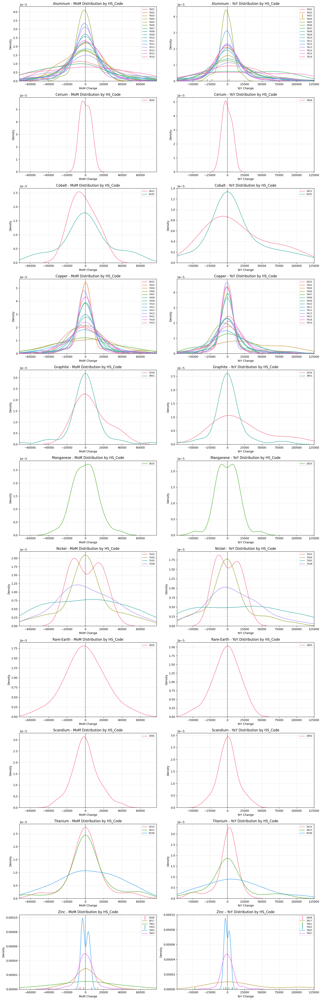

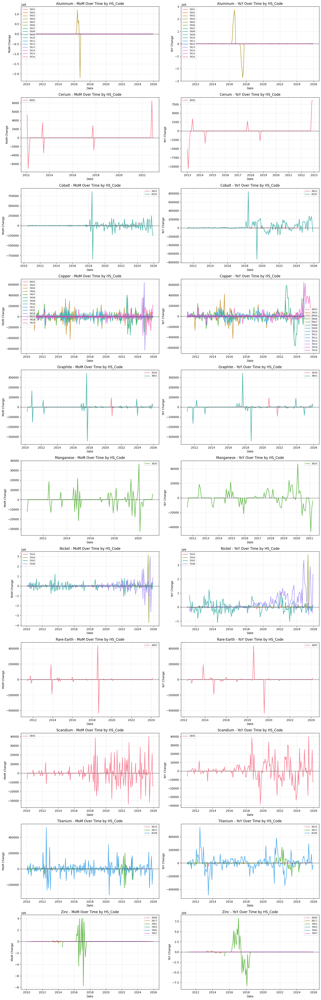

In [30]:
# Element-HS_Code visualization (mirrors Element-Country)

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


df_hs_source = df.copy()
df_hs_source["Date"] = pd.to_datetime(
    {
        "year": df_hs_source["Year"],
        "month": df_hs_source["Month"],
        "day": 1,
    },
    errors="coerce",
)

df_hs_source = df_hs_source.dropna(
    subset=["Date", "Element", "HS_Code", "Real_Value"]
).copy()

df_hs_source["Element"] = df_hs_source["Element"].astype(str).str.strip()
df_hs_source["HS_Code"] = df_hs_source["HS_Code"].astype(str).str.strip()

# Keep all available HS codes
hs_codes = sorted(df_hs_source["HS_Code"].dropna().unique().tolist())

if not hs_codes:
    raise ValueError("No HS_Code values available after preprocessing.")

# Aggregate monthly values at the HS_Code-Element level
df_hs_agg = (
    df_hs_source.groupby(["HS_Code", "Element", "Date"], as_index=False)["Real_Value"]
    .sum()
    .sort_values(["HS_Code", "Element", "Date"])
)

# Fill missing months within each HS_Code-Element series
def build_element_hs_panel(data, mode="group"):
    filled_groups = []

    if data.empty:
        raise ValueError("Input data for build_element_hs_panel is empty.")

    if mode == "global":
        global_dates = pd.date_range(data["Date"].min(), data["Date"].max(), freq="MS")

    for (hs_code, element), group_df in data.groupby(["HS_Code", "Element"]):
        group_df = group_df.sort_values("Date").copy()

        if mode == "group":
            full_dates = pd.date_range(
                group_df["Date"].min(),
                group_df["Date"].max(),
                freq="MS"
            )
        elif mode == "global":
            full_dates = global_dates
        else:
            raise ValueError("mode must be 'group' or 'global'")

        completed = (
            group_df.set_index("Date")
            .reindex(full_dates)
            .rename_axis("Date")
            .reset_index()
        )

        completed["HS_Code"] = hs_code
        completed["Element"] = element
        completed["Real_Value"] = completed["Real_Value"].fillna(0)

        filled_groups.append(completed)

    panel = pd.concat(filled_groups, ignore_index=True)
    panel["Year"] = panel["Date"].dt.year
    panel["Month"] = panel["Date"].dt.month
    panel = panel.sort_values(["HS_Code", "Element", "Date"]).reset_index(drop=True)

    return panel[["Date", "Year", "Month", "HS_Code", "Element", "Real_Value"]]


df_element_hs = build_element_hs_panel(df_hs_agg, mode="group")
elements_hs = sorted(df_element_hs["Element"].dropna().unique())

if not elements_hs:
    raise ValueError("No Element values available after building HS panel.")

# Build monthly MoM / YoY series for each HS_Code-Element pair
series_dict_hs = {}
all_mom_hs = []
all_yoy_hs = []

for (hs_code, element), group_df in df_element_hs.groupby(["HS_Code", "Element"]):
    monthly_series = (
        group_df.groupby(["Year", "Month"], as_index=False)["Real_Value"]
        .sum()
        .sort_values(["Year", "Month"])
    )

    monthly_series["Date"] = pd.to_datetime(
        {
            "year": monthly_series["Year"],
            "month": monthly_series["Month"],
            "day": 1,
        }
    )
    monthly_series = monthly_series.sort_values("Date").reset_index(drop=True)

    monthly_series["MoM_change"] = monthly_series["Real_Value"].diff()
    monthly_series["YoY_change"] = monthly_series["Real_Value"].diff(12)

    series_dict_hs[(hs_code, element)] = monthly_series

    mom_values = monthly_series["MoM_change"].dropna()
    yoy_values = monthly_series["YoY_change"].dropna()

    if not mom_values.empty:
        all_mom_hs.append(mom_values)
    if not yoy_values.empty:
        all_yoy_hs.append(yoy_values)

if not all_mom_hs:
    raise ValueError("Not enough data to compute MoM for HS_Code panel.")
if not all_yoy_hs:
    raise ValueError("Not enough data to compute YoY for HS_Code panel.")

all_mom_hs = pd.concat(all_mom_hs, ignore_index=True)
all_yoy_hs = pd.concat(all_yoy_hs, ignore_index=True)

mom_low_hs, mom_high_hs = all_mom_hs.quantile([X_QUANTILE_LOW, X_QUANTILE_HIGH])
yoy_low_hs, yoy_high_hs = all_yoy_hs.quantile([X_QUANTILE_LOW, X_QUANTILE_HIGH])

mom_zero_cut_hs = all_mom_hs.abs().quantile(NEAR_ZERO_QUANTILE)
yoy_zero_cut_hs = all_yoy_hs.abs().quantile(NEAR_ZERO_QUANTILE)

print(f"Total HS codes: {len(hs_codes)}")
print("Elements:", elements_hs)
print(f"MoM observations (HS): {len(all_mom_hs)}")
print(f"YoY observations (HS): {len(all_yoy_hs)}")

# Assign colors separately within each element
element_color_maps = {}

for element in elements_hs:
    element_hs_codes = sorted(
        [hs for hs in hs_codes if (hs, element) in series_dict_hs]
    )

    if len(element_hs_codes) == 0:
        element_color_maps[element] = {}
        continue

    palette_hs = sns.color_palette("husl", n_colors=len(element_hs_codes))
    element_color_maps[element] = dict(zip(element_hs_codes, palette_hs))

def filter_changes_for_density_hs(series, low, high, near_zero_cutoff):
    filtered = series.dropna()
    filtered = filtered[(filtered >= low) & (filtered <= high)]
    filtered = filtered[filtered.abs() > near_zero_cutoff]
    return filtered


def plot_density_or_ticks_hs(ax, values, label, color):
    if len(values) > 3:
        sns.kdeplot(
            data=values,
            ax=ax,
            label=label,
            color=color,
            linewidth=1.8,
            alpha=0.8,
            fill=False,
        )
        return True

    if 1 <= len(values) <= 3:
        ax.scatter(
            values.values,
            np.zeros(len(values)),
            label=label,
            color=color,
            marker="|",
            s=220,
            linewidths=2,
            alpha=0.95,
        )
        return True

    return False

# Distribution plots: one row per element, split into MoM and YoY
nrows = len(elements_hs)
fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(16, 4.5 * nrows))

if nrows == 1:
    axes = np.array([axes])

for row_index, element in enumerate(elements_hs):
    ax_mom = axes[row_index, 0]
    ax_yoy = axes[row_index, 1]

    plotted_mom = False
    plotted_yoy = False

    element_hs_codes = sorted(
        [hs for hs in hs_codes if (hs, element) in series_dict_hs]
    )

    for hs_code in element_hs_codes:
        key = (hs_code, element)
        monthly_series = series_dict_hs[key]
        color = element_color_maps[element][hs_code]

        mom_values = filter_changes_for_density_hs(
            monthly_series["MoM_change"],
            mom_low_hs,
            mom_high_hs,
            mom_zero_cut_hs,
        )
        yoy_values = filter_changes_for_density_hs(
            monthly_series["YoY_change"],
            yoy_low_hs,
            yoy_high_hs,
            yoy_zero_cut_hs,
        )

        plotted_mom = plot_density_or_ticks_hs(
            ax_mom, mom_values, hs_code, color
        ) or plotted_mom

        plotted_yoy = plot_density_or_ticks_hs(
            ax_yoy, yoy_values, hs_code, color
        ) or plotted_yoy

    ax_mom.axvline(0, color="black", linestyle="--", linewidth=1)
    ax_mom.set_xlim(mom_low_hs, mom_high_hs)
    ax_mom.set_title(f"{element} - MoM Distribution by HS_Code")
    ax_mom.set_xlabel("MoM Change")
    ax_mom.set_ylabel("Density")
    ax_mom.grid(True, alpha=0.3)
    if plotted_mom:
        ax_mom.legend(fontsize=8)

    ax_yoy.axvline(0, color="black", linestyle="--", linewidth=1)
    ax_yoy.set_xlim(yoy_low_hs, yoy_high_hs)
    ax_yoy.set_title(f"{element} - YoY Distribution by HS_Code")
    ax_yoy.set_xlabel("YoY Change")
    ax_yoy.set_ylabel("Density")
    ax_yoy.grid(True, alpha=0.3)
    if plotted_yoy:
        ax_yoy.legend(fontsize=8)

plt.tight_layout()
plt.show()

# Time-series plots: one row per element, split into MoM and YoY
nrows = len(elements_hs)
fig, axes = plt.subplots(
    nrows=nrows,
    ncols=2,
    figsize=(16, 4.5 * nrows),
    sharex=False
)

if nrows == 1:
    axes = np.array([axes])

for row_index, element in enumerate(elements_hs):
    ax_mom = axes[row_index, 0]
    ax_yoy = axes[row_index, 1]

    plotted_mom = False
    plotted_yoy = False

    element_hs_codes = sorted(
        [hs for hs in hs_codes if (hs, element) in series_dict_hs]
    )

    for hs_code in element_hs_codes:
        key = (hs_code, element)
        monthly_series = series_dict_hs[key]
        color = element_color_maps[element][hs_code]

        if monthly_series["MoM_change"].notna().any():
            ax_mom.plot(
                monthly_series["Date"],
                monthly_series["MoM_change"],
                label=hs_code,
                color=color,
                linewidth=1.8,
                alpha=0.9,
            )
            plotted_mom = True

        if monthly_series["YoY_change"].notna().any():
            ax_yoy.plot(
                monthly_series["Date"],
                monthly_series["YoY_change"],
                label=hs_code,
                color=color,
                linewidth=1.8,
                alpha=0.9,
            )
            plotted_yoy = True

    ax_mom.axhline(0, color="black", linestyle="--", linewidth=1)
    ax_mom.set_title(f"{element} - MoM Over Time by HS_Code")
    ax_mom.set_xlabel("Date")
    ax_mom.set_ylabel("MoM Change")
    ax_mom.grid(True, alpha=0.3)
    if plotted_mom:
        ax_mom.legend(fontsize=8)

    ax_yoy.axhline(0, color="black", linestyle="--", linewidth=1)
    ax_yoy.set_title(f"{element} - YoY Over Time by HS_Code")
    ax_yoy.set_xlabel("Date")
    ax_yoy.set_ylabel("YoY Change")
    ax_yoy.grid(True, alpha=0.3)
    if plotted_yoy:
        ax_yoy.legend(fontsize=8)

plt.tight_layout()
plt.show()